### Importing the Necessary Pacakges

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

### Importing the dataset

In [4]:
df_train=pd.read_csv("C:/Users/Sham/Futura/futura_train.csv")

### First training of Training Data we have

In [5]:
df_train

,Unnamed: 0,NAME,USER_ID,HOURS_DATASCIENCE,HOURS_BACKEND,HOURS_FRONTEND,NUM_COURSES_BEGINNER_DATASCIENCE,NUM_COURSES_BEGINNER_BACKEND,NUM_COURSES_BEGINNER_FRONTEND,NUM_COURSES_ADVANCED_DATASCIENCE,NUM_COURSES_ADVANCED_BACKEND,NUM_COURSES_ADVANCED_FRONTEND,AVG_SCORE_DATASCIENCE,AVG_SCORE_BACKEND,AVG_SCORE_FRONTEND,PROFILE
0,28,Story Muto,58283940,7.0,39.0,29.0,2.0,4.0,0.0,2.0,5.0,0.0,84.0,74.0,NaN,beginner_front_end
1,81,Carlos Ferro,1357218,32.0,0.0,44.0,2.0,0.0,0.0,0.0,5.0,0.0,67.0,45.0,NaN,beginner_front_end
2,89,Robby Constantini,63212105,45.0,0.0,59.0,0.0,5.0,4.0,0.0,4.0,1.0,NaN,54.0,47.0,advanced_front_end
3,138,Paul Mckenny,23239851,36.0,19.0,28.0,0.0,5.0,7.0,0.0,5.0,3.0,NaN,71.0,89.0,beginner_data_science
4,143,Jean Webb,72234478,61.0,78.0,38.0,6.0,11.0,0.0,4.0,3.0,0.0,66.0,85.0,NaN,advanced_front_end
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,20495,Rose Jurado,66754730,0.0,44.0,42.0,8.0,4.0,7.0,3.0,3.0,3.0,74.0,73.0,93.0,advanced_backend
19996,20496,Johnny Jones,6874888,0.0,85.0,63.0,3.0,5.0,0.0,4.0,7.0,3.0,50.0,83.0,94.0,advanced_front_end
19997,20497,Lawrence Givens,83752787,32.0,50.0,22.0,0.0,4.0,0.0,6.0,2.0,3.0,61.0,81.0,75.0,advanced_backend
19998,20498,Betty Diclaudio,45806698,0.0,96.0,69.0,3.0,3.0,3.0,5.0,7.0,4.0,64.0,68.0,68.0,advanced_front_end


### Analyzing the datatype we had in each column

In [6]:
df_train.dtypes

Unnamed: 0                            int64
NAME                                 object
USER_ID                               int64
HOURS_DATASCIENCE                   float64
HOURS_BACKEND                       float64
HOURS_FRONTEND                      float64
NUM_COURSES_BEGINNER_DATASCIENCE    float64
NUM_COURSES_BEGINNER_BACKEND        float64
NUM_COURSES_BEGINNER_FRONTEND       float64
NUM_COURSES_ADVANCED_DATASCIENCE    float64
NUM_COURSES_ADVANCED_BACKEND        float64
NUM_COURSES_ADVANCED_FRONTEND       float64
AVG_SCORE_DATASCIENCE               float64
AVG_SCORE_BACKEND                   float64
AVG_SCORE_FRONTEND                  float64
PROFILE                              object
dtype: object

In [7]:
df_train.columns

Index(['Unnamed: 0', 'NAME', 'USER_ID', 'HOURS_DATASCIENCE', 'HOURS_BACKEND',
       'HOURS_FRONTEND', 'NUM_COURSES_BEGINNER_DATASCIENCE',
       'NUM_COURSES_BEGINNER_BACKEND', 'NUM_COURSES_BEGINNER_FRONTEND',
       'NUM_COURSES_ADVANCED_DATASCIENCE', 'NUM_COURSES_ADVANCED_BACKEND',
       'NUM_COURSES_ADVANCED_FRONTEND', 'AVG_SCORE_DATASCIENCE',
       'AVG_SCORE_BACKEND', 'AVG_SCORE_FRONTEND', 'PROFILE'],
      dtype='object')

### Displaying the Null Values present in the dataset

In [8]:
df_train.isnull().sum()

Unnamed: 0                            0
NAME                                  0
USER_ID                               0
HOURS_DATASCIENCE                    14
HOURS_BACKEND                        53
HOURS_FRONTEND                       16
NUM_COURSES_BEGINNER_DATASCIENCE     26
NUM_COURSES_BEGINNER_BACKEND         18
NUM_COURSES_BEGINNER_FRONTEND        39
NUM_COURSES_ADVANCED_DATASCIENCE      2
NUM_COURSES_ADVANCED_BACKEND          8
NUM_COURSES_ADVANCED_FRONTEND        37
AVG_SCORE_DATASCIENCE               220
AVG_SCORE_BACKEND                    84
AVG_SCORE_FRONTEND                  168
PROFILE                               0
dtype: int64

### Dropping Unecessary Columns because they are unique and wont distrub much to our model

In [9]:
df_train=df_train.drop(columns=['NAME','Unnamed: 0', 'USER_ID'])

In [10]:
df_train.dtypes

HOURS_DATASCIENCE                   float64
HOURS_BACKEND                       float64
HOURS_FRONTEND                      float64
NUM_COURSES_BEGINNER_DATASCIENCE    float64
NUM_COURSES_BEGINNER_BACKEND        float64
NUM_COURSES_BEGINNER_FRONTEND       float64
NUM_COURSES_ADVANCED_DATASCIENCE    float64
NUM_COURSES_ADVANCED_BACKEND        float64
NUM_COURSES_ADVANCED_FRONTEND       float64
AVG_SCORE_DATASCIENCE               float64
AVG_SCORE_BACKEND                   float64
AVG_SCORE_FRONTEND                  float64
PROFILE                              object
dtype: object

### Seperating Dependent and Independent Variables

### x -> Independent Variables
### y -> Dependent Variable

In [11]:
x = df_train.iloc[:, :-1].values
y = df_train.iloc[:, -1].values

### Imputing the missing values in our Dataset

In [12]:
si_most_frequent = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

si_mean = SimpleImputer(missing_values=np.nan, strategy='mean')

for col in df_train.columns:
    if df_train[col].dtype == 'object': 
        df_train[col] = si_most_frequent.fit_transform(df_train[[col]]).ravel()
    elif df_train[col].dtype == 'float64':  
        df_train[col] = si_mean.fit_transform(df_train[[col]]).ravel()

df_train

,HOURS_DATASCIENCE,HOURS_BACKEND,HOURS_FRONTEND,NUM_COURSES_BEGINNER_DATASCIENCE,NUM_COURSES_BEGINNER_BACKEND,NUM_COURSES_BEGINNER_FRONTEND,NUM_COURSES_ADVANCED_DATASCIENCE,NUM_COURSES_ADVANCED_BACKEND,NUM_COURSES_ADVANCED_FRONTEND,AVG_SCORE_DATASCIENCE,AVG_SCORE_BACKEND,AVG_SCORE_FRONTEND,PROFILE
0,7.0,39.0,29.0,2.0,4.0,0.0,2.0,5.0,0.0,84.000000,74.0,67.130748,beginner_front_end
1,32.0,0.0,44.0,2.0,0.0,0.0,0.0,5.0,0.0,67.000000,45.0,67.130748,beginner_front_end
2,45.0,0.0,59.0,0.0,5.0,4.0,0.0,4.0,1.0,65.070324,54.0,47.000000,advanced_front_end
3,36.0,19.0,28.0,0.0,5.0,7.0,0.0,5.0,3.0,65.070324,71.0,89.000000,beginner_data_science
4,61.0,78.0,38.0,6.0,11.0,0.0,4.0,3.0,0.0,66.000000,85.0,67.130748,advanced_front_end
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0.0,44.0,42.0,8.0,4.0,7.0,3.0,3.0,3.0,74.000000,73.0,93.000000,advanced_backend
19996,0.0,85.0,63.0,3.0,5.0,0.0,4.0,7.0,3.0,50.000000,83.0,94.000000,advanced_front_end
19997,32.0,50.0,22.0,0.0,4.0,0.0,6.0,2.0,3.0,61.000000,81.0,75.000000,advanced_backend
19998,0.0,96.0,69.0,3.0,3.0,3.0,5.0,7.0,4.0,64.000000,68.0,68.000000,advanced_front_end


In [13]:
df_train.isnull().sum()

HOURS_DATASCIENCE                   0
HOURS_BACKEND                       0
HOURS_FRONTEND                      0
NUM_COURSES_BEGINNER_DATASCIENCE    0
NUM_COURSES_BEGINNER_BACKEND        0
NUM_COURSES_BEGINNER_FRONTEND       0
NUM_COURSES_ADVANCED_DATASCIENCE    0
NUM_COURSES_ADVANCED_BACKEND        0
NUM_COURSES_ADVANCED_FRONTEND       0
AVG_SCORE_DATASCIENCE               0
AVG_SCORE_BACKEND                   0
AVG_SCORE_FRONTEND                  0
PROFILE                             0
dtype: int64

### Encoding all the categorical variables

In [14]:
pd.DataFrame(y)

,0
0,beginner_front_end
1,beginner_front_end
2,advanced_front_end
3,beginner_data_science
4,advanced_front_end
...,...
19995,advanced_backend
19996,advanced_front_end
19997,advanced_backend
19998,advanced_front_end


### Encoding the Categorical Variable

In [15]:
le = LabelEncoder()

#here we are taking the categorical variable "Profile"
y=le.fit_transform(y) 
pd.DataFrame(y)

,0
0,5
1,5
2,2
3,4
4,2
...,...
19995,0
19996,2
19997,0
19998,2


### Splitting the training and testing data

In [16]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,train_size=0.8,random_state=42)

### Imputing the missing values of splitted values

In [17]:
si = SimpleImputer()
x_train = si.fit_transform(x_train)
x_test = si.fit_transform(x_test)

y_train = si.fit_transform(y_train.reshape(-1, 1)).ravel()
y_test = si.fit_transform(y_test.reshape(-1, 1)).ravel()

### Feature Scaling of our data

In [18]:
scaler = StandardScaler()

X_train = scaler.fit_transform(x_train)
X_test = scaler.fit_transform(x_test)

# Assuming y_train and y_test are also 1D arrays
Y_train = scaler.fit_transform(y_train.reshape(-1, 1))
Y_test = scaler.fit_transform(y_test.reshape(-1, 1))

### Using KNN Algorithm for Predictions

In [19]:
from sklearn.neighbors import KNeighborsClassifier

k = 5  # Number of neighbors
knn_classifier = KNeighborsClassifier(n_neighbors=k)

In [20]:
# Train the KNN classifier
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [21]:
# Make predictions on the testing set
y_pred = knn_classifier.predict(X_test)

In [22]:
#Checking the accuracy score
knn_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", knn_accuracy)

Accuracy: 0.93275


### Using Random Forest Classifier Algorithm

In [23]:
from sklearn.ensemble import RandomForestClassifier


rf_model = RandomForestClassifier( n_estimators = 200, random_state=42)
#Training the Random Forest Classifier
rf_model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=42)

In [24]:
#Making predictions on testing set
rf_pred = rf_model.predict(X_test)

# Checking the accuracy of the model
rf_accuracy = accuracy_score(y_test, rf_pred)
print("Accuracy:", rf_accuracy)

Accuracy: 0.91075


### Using Decision Tree Algorithm

In [25]:
from sklearn.tree import DecisionTreeClassifier

# Specify parameters as keyword arguments
dt_model = DecisionTreeClassifier(splitter='random', 
                               min_samples_split=10, 
                               min_samples_leaf=5, 
                               max_leaf_nodes=None, 
                               max_features=None, 
                               criterion='entropy')
#Training the Decision Tree Classifier
dt_model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', min_samples_leaf=5,
                       min_samples_split=10, splitter='random')

In [26]:
#Making predictions on the testing set
dt_pred = dt_model.predict(X_test)

#Calculating accuracy of the model using this algorithm
dt_acc = accuracy_score(y_test , dt_pred)
print("Accuracy:", dt_acc)

Accuracy: 0.73125


### Using SVC algorithm

In [27]:
from sklearn.svm import SVC

# Intializing the Model
svc = SVC()

#Training the model using Training Set
svc.fit(X_train,y_train)

#making predictions using testing set
svc_pred = svc.predict(X_test)

#Checking the accuracy using this model
svc_acc = accuracy_score(y_test , svc_pred)
print("Accuracy:",svc_acc)

Accuracy: 0.95


### Using Gradient Boosting Algorithm

In [28]:
import xgboost as xgb

#Intializing the model
xgb_model = xgb.XGBClassifier()

# Train the model using Training Set
xgb_model.fit(X_train, y_train)

# Making predictions on the testing set
xgb_pred = xgb_model.predict(X_test)

# Calculating the accuracy score
xgb_acc = accuracy_score(y_test, xgb_pred)
print("Accuracy:", xgb_acc)

Accuracy: 0.90625


### Using Gradient Boosting Classifier

In [29]:
from sklearn.ensemble import GradientBoostingClassifier

# Intializing the model
gbdt = GradientBoostingClassifier(n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    min_samples_split=2,
    min_samples_leaf=1,
    subsample=1.0)

# Training using training data
gbdt.fit(X_train, y_train)

# Make predictions on the testing data
gbdt_pred = gbdt.predict(X_test)

# Calculate the accuracy score
gbdt_accuracy = accuracy_score(y_test, gbdt_pred)
print("Accuracy:", gbdt_accuracy)

Accuracy: 0.869


### Checking with testing dataset

In [30]:
df_test = pd.read_csv("C:/Users/Sham/Futura/futura_test.csv")
df_test

,Unnamed: 0,NAME,USER_ID,HOURS_DATASCIENCE,HOURS_BACKEND,HOURS_FRONTEND,NUM_COURSES_BEGINNER_DATASCIENCE,NUM_COURSES_BEGINNER_BACKEND,NUM_COURSES_BEGINNER_FRONTEND,NUM_COURSES_ADVANCED_DATASCIENCE,NUM_COURSES_ADVANCED_BACKEND,NUM_COURSES_ADVANCED_FRONTEND,AVG_SCORE_DATASCIENCE,AVG_SCORE_BACKEND,AVG_SCORE_FRONTEND
0,0,Melody Gentry,39064009,84,30,0,4,6,3,3,7,6,51,74,37
1,1,Lera Mitchel,26414743,42,74,13,3,6,4,2,7,5,82,59,50
2,2,Diae Ransdell,40811094,18,76,38,5,2,8,8,3,8,77,53,50
3,3,Michael Sellers,46199789,77,29,23,7,2,6,1,6,1,68,57,60
4,4,Evel Hilliard,95025845,35,14,39,0,5,3,2,8,3,63,82,91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,506,Eileen Finley,1147648,0,56,11,2,1,8,5,2,6,80,93,35
496,507,Cedric Buss,33729943,50,53,5,4,1,4,8,4,4,59,59,50
497,508,James Ray,62724217,35,35,63,3,0,0,5,3,5,35,54,59
498,509,Lauren Vega,71562358,42,4,58,6,6,5,7,7,5,78,59,79


In [31]:
df_test.columns

Index(['Unnamed: 0', 'NAME', 'USER_ID', 'HOURS_DATASCIENCE', 'HOURS_BACKEND',
       'HOURS_FRONTEND', 'NUM_COURSES_BEGINNER_DATASCIENCE',
       'NUM_COURSES_BEGINNER_BACKEND', 'NUM_COURSES_BEGINNER_FRONTEND',
       'NUM_COURSES_ADVANCED_DATASCIENCE', 'NUM_COURSES_ADVANCED_BACKEND',
       'NUM_COURSES_ADVANCED_FRONTEND', 'AVG_SCORE_DATASCIENCE',
       'AVG_SCORE_BACKEND', 'AVG_SCORE_FRONTEND'],
      dtype='object')

In [32]:
df_test = df_test.drop(columns=['Unnamed: 0','NAME','USER_ID'])
df_test

,HOURS_DATASCIENCE,HOURS_BACKEND,HOURS_FRONTEND,NUM_COURSES_BEGINNER_DATASCIENCE,NUM_COURSES_BEGINNER_BACKEND,NUM_COURSES_BEGINNER_FRONTEND,NUM_COURSES_ADVANCED_DATASCIENCE,NUM_COURSES_ADVANCED_BACKEND,NUM_COURSES_ADVANCED_FRONTEND,AVG_SCORE_DATASCIENCE,AVG_SCORE_BACKEND,AVG_SCORE_FRONTEND
0,84,30,0,4,6,3,3,7,6,51,74,37
1,42,74,13,3,6,4,2,7,5,82,59,50
2,18,76,38,5,2,8,8,3,8,77,53,50
3,77,29,23,7,2,6,1,6,1,68,57,60
4,35,14,39,0,5,3,2,8,3,63,82,91
...,...,...,...,...,...,...,...,...,...,...,...,...
495,0,56,11,2,1,8,5,2,6,80,93,35
496,50,53,5,4,1,4,8,4,4,59,59,50
497,35,35,63,3,0,0,5,3,5,35,54,59
498,42,4,58,6,6,5,7,7,5,78,59,79


In [33]:
df_test.isnull().sum()

HOURS_DATASCIENCE                   0
HOURS_BACKEND                       0
HOURS_FRONTEND                      0
NUM_COURSES_BEGINNER_DATASCIENCE    0
NUM_COURSES_BEGINNER_BACKEND        0
NUM_COURSES_BEGINNER_FRONTEND       0
NUM_COURSES_ADVANCED_DATASCIENCE    0
NUM_COURSES_ADVANCED_BACKEND        0
NUM_COURSES_ADVANCED_FRONTEND       0
AVG_SCORE_DATASCIENCE               0
AVG_SCORE_BACKEND                   0
AVG_SCORE_FRONTEND                  0
dtype: int64

In [34]:
df_test.dtypes

HOURS_DATASCIENCE                   int64
HOURS_BACKEND                       int64
HOURS_FRONTEND                      int64
NUM_COURSES_BEGINNER_DATASCIENCE    int64
NUM_COURSES_BEGINNER_BACKEND        int64
NUM_COURSES_BEGINNER_FRONTEND       int64
NUM_COURSES_ADVANCED_DATASCIENCE    int64
NUM_COURSES_ADVANCED_BACKEND        int64
NUM_COURSES_ADVANCED_FRONTEND       int64
AVG_SCORE_DATASCIENCE               int64
AVG_SCORE_BACKEND                   int64
AVG_SCORE_FRONTEND                  int64
dtype: object

### Checking the testing data with our best models

In [129]:
svc.predict(df_test)
#here the output is biased

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [128]:
knn_classifier.predict(df_test)

array([4., 2., 2., 4., 4., 0., 4., 4., 4., 4., 2., 0., 2., 2., 4., 2., 2.,
       4., 4., 4., 4., 4., 2., 2., 4., 4., 4., 4., 4., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 4., 4., 4., 0., 0., 4., 4., 2., 2., 2., 4., 4., 4.,
       2., 4., 2., 0., 4., 4., 4., 2., 2., 2., 0., 2., 4., 4., 4., 4., 4.,
       4., 4., 0., 0., 4., 0., 4., 3., 0., 4., 4., 4., 2., 2., 4., 4., 0.,
       2., 4., 4., 4., 2., 0., 2., 0., 4., 4., 2., 4., 2., 4., 4., 0., 4.,
       2., 4., 2., 0., 0., 4., 4., 4., 4., 2., 0., 2., 0., 2., 4., 0., 4.,
       4., 4., 2., 4., 2., 4., 2., 0., 4., 0., 0., 4., 0., 3., 2., 4., 2.,
       0., 4., 4., 4., 0., 4., 0., 4., 4., 4., 4., 0., 4., 2., 2., 4., 2.,
       0., 4., 2., 2., 4., 0., 2., 0., 4., 3., 4., 0., 4., 2., 0., 2., 4.,
       4., 4., 2., 4., 0., 2., 4., 2., 4., 2., 2., 2., 2., 4., 0., 4., 2.,
       0., 4., 2., 2., 4., 4., 4., 0., 4., 0., 4., 0., 2., 0., 4., 2., 2.,
       4., 4., 4., 2., 0., 4., 2., 2., 2., 0., 2., 0., 0., 4., 4., 4., 2.,
       4., 4., 4., 2., 3.

### Visualization

In [46]:
df = pd.concat([df_train, df_test], ignore_index=True)
df

,HOURS_DATASCIENCE,HOURS_BACKEND,HOURS_FRONTEND,NUM_COURSES_BEGINNER_DATASCIENCE,NUM_COURSES_BEGINNER_BACKEND,NUM_COURSES_BEGINNER_FRONTEND,NUM_COURSES_ADVANCED_DATASCIENCE,NUM_COURSES_ADVANCED_BACKEND,NUM_COURSES_ADVANCED_FRONTEND,AVG_SCORE_DATASCIENCE,AVG_SCORE_BACKEND,AVG_SCORE_FRONTEND,PROFILE
0,7.0,39.0,29.0,2.0,4.0,0.0,2.0,5.0,0.0,84.000000,74.0,67.130748,beginner_front_end
1,32.0,0.0,44.0,2.0,0.0,0.0,0.0,5.0,0.0,67.000000,45.0,67.130748,beginner_front_end
2,45.0,0.0,59.0,0.0,5.0,4.0,0.0,4.0,1.0,65.070324,54.0,47.000000,advanced_front_end
3,36.0,19.0,28.0,0.0,5.0,7.0,0.0,5.0,3.0,65.070324,71.0,89.000000,beginner_data_science
4,61.0,78.0,38.0,6.0,11.0,0.0,4.0,3.0,0.0,66.000000,85.0,67.130748,advanced_front_end
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20495,0.0,56.0,11.0,2.0,1.0,8.0,5.0,2.0,6.0,80.000000,93.0,35.000000,NaN
20496,50.0,53.0,5.0,4.0,1.0,4.0,8.0,4.0,4.0,59.000000,59.0,50.000000,NaN
20497,35.0,35.0,63.0,3.0,0.0,0.0,5.0,3.0,5.0,35.000000,54.0,59.000000,NaN
20498,42.0,4.0,58.0,6.0,6.0,5.0,7.0,7.0,5.0,78.000000,59.0,79.000000,NaN


In [42]:
df.isnull().sum()

HOURS_DATASCIENCE                     0
HOURS_BACKEND                         0
HOURS_FRONTEND                        0
NUM_COURSES_BEGINNER_DATASCIENCE      0
NUM_COURSES_BEGINNER_BACKEND          0
NUM_COURSES_BEGINNER_FRONTEND         0
NUM_COURSES_ADVANCED_DATASCIENCE      0
NUM_COURSES_ADVANCED_BACKEND          0
NUM_COURSES_ADVANCED_FRONTEND         0
AVG_SCORE_DATASCIENCE                 0
AVG_SCORE_BACKEND                     0
AVG_SCORE_FRONTEND                    0
PROFILE                             500
dtype: int64

In [50]:
si_most_frequent = SimpleImputer(strategy='most_frequent')

df['PROFILE'] = si_most_frequent.fit_transform(df[['PROFILE']]).ravel()

In [51]:
df

,HOURS_DATASCIENCE,HOURS_BACKEND,HOURS_FRONTEND,NUM_COURSES_BEGINNER_DATASCIENCE,NUM_COURSES_BEGINNER_BACKEND,NUM_COURSES_BEGINNER_FRONTEND,NUM_COURSES_ADVANCED_DATASCIENCE,NUM_COURSES_ADVANCED_BACKEND,NUM_COURSES_ADVANCED_FRONTEND,AVG_SCORE_DATASCIENCE,AVG_SCORE_BACKEND,AVG_SCORE_FRONTEND,PROFILE
0,7.0,39.0,29.0,2.0,4.0,0.0,2.0,5.0,0.0,84.000000,74.0,67.130748,beginner_front_end
1,32.0,0.0,44.0,2.0,0.0,0.0,0.0,5.0,0.0,67.000000,45.0,67.130748,beginner_front_end
2,45.0,0.0,59.0,0.0,5.0,4.0,0.0,4.0,1.0,65.070324,54.0,47.000000,advanced_front_end
3,36.0,19.0,28.0,0.0,5.0,7.0,0.0,5.0,3.0,65.070324,71.0,89.000000,beginner_data_science
4,61.0,78.0,38.0,6.0,11.0,0.0,4.0,3.0,0.0,66.000000,85.0,67.130748,advanced_front_end
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20495,0.0,56.0,11.0,2.0,1.0,8.0,5.0,2.0,6.0,80.000000,93.0,35.000000,advanced_backend
20496,50.0,53.0,5.0,4.0,1.0,4.0,8.0,4.0,4.0,59.000000,59.0,50.000000,advanced_backend
20497,35.0,35.0,63.0,3.0,0.0,0.0,5.0,3.0,5.0,35.000000,54.0,59.000000,advanced_backend
20498,42.0,4.0,58.0,6.0,6.0,5.0,7.0,7.0,5.0,78.000000,59.0,79.000000,advanced_backend


In [52]:
df.isnull().sum()

HOURS_DATASCIENCE                   0
HOURS_BACKEND                       0
HOURS_FRONTEND                      0
NUM_COURSES_BEGINNER_DATASCIENCE    0
NUM_COURSES_BEGINNER_BACKEND        0
NUM_COURSES_BEGINNER_FRONTEND       0
NUM_COURSES_ADVANCED_DATASCIENCE    0
NUM_COURSES_ADVANCED_BACKEND        0
NUM_COURSES_ADVANCED_FRONTEND       0
AVG_SCORE_DATASCIENCE               0
AVG_SCORE_BACKEND                   0
AVG_SCORE_FRONTEND                  0
PROFILE                             0
dtype: int64

In [53]:
df.columns

Index(['HOURS_DATASCIENCE', 'HOURS_BACKEND', 'HOURS_FRONTEND',
       'NUM_COURSES_BEGINNER_DATASCIENCE', 'NUM_COURSES_BEGINNER_BACKEND',
       'NUM_COURSES_BEGINNER_FRONTEND', 'NUM_COURSES_ADVANCED_DATASCIENCE',
       'NUM_COURSES_ADVANCED_BACKEND', 'NUM_COURSES_ADVANCED_FRONTEND',
       'AVG_SCORE_DATASCIENCE', 'AVG_SCORE_BACKEND', 'AVG_SCORE_FRONTEND',
       'PROFILE'],
      dtype='object')

### Histogram

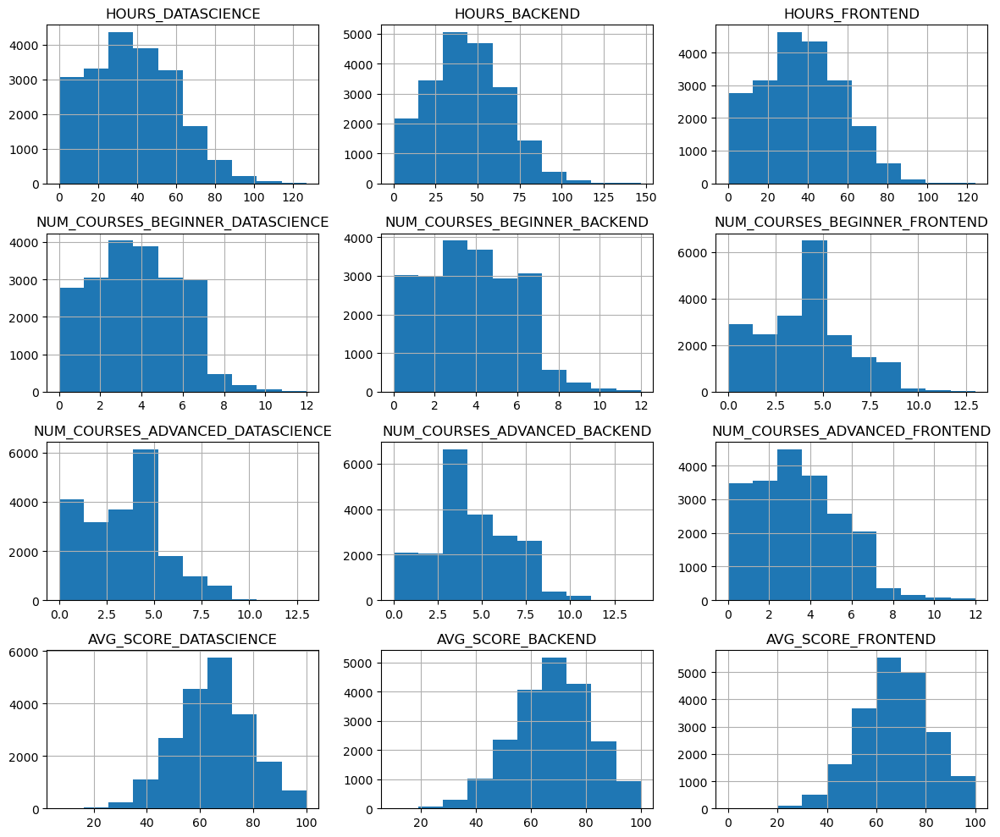

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histograms
df.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

### Box Plot

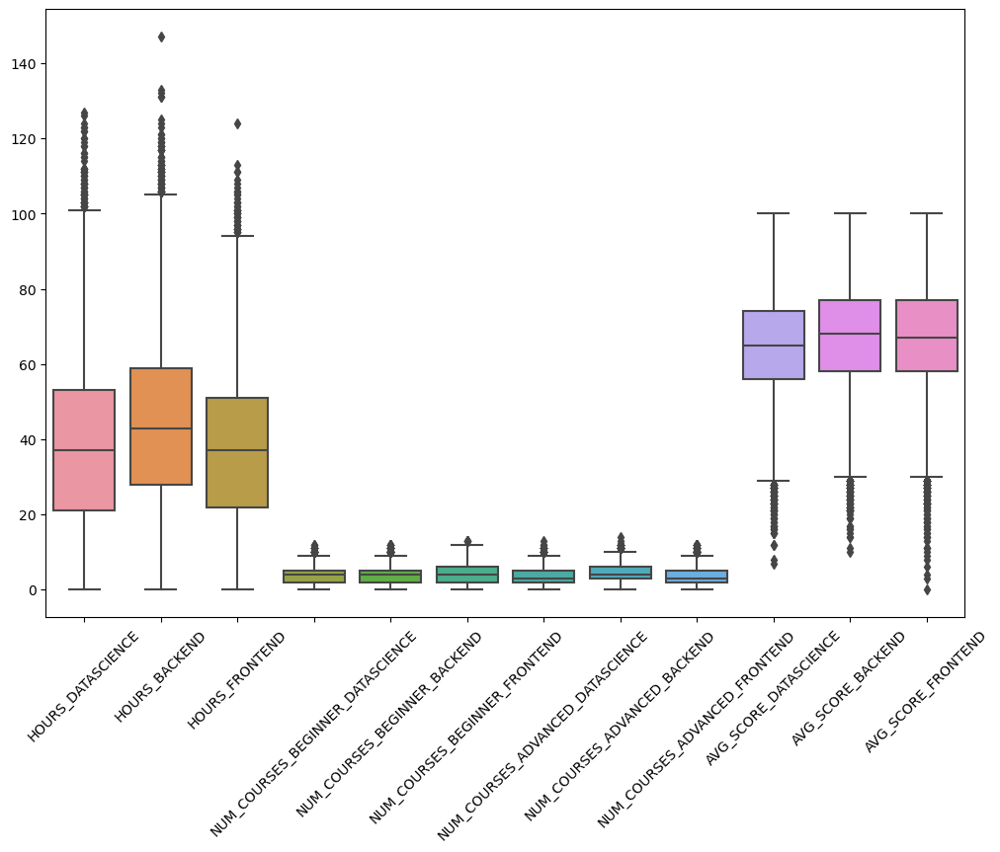

In [55]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.show()

### Bar plot for 'PROFILE'

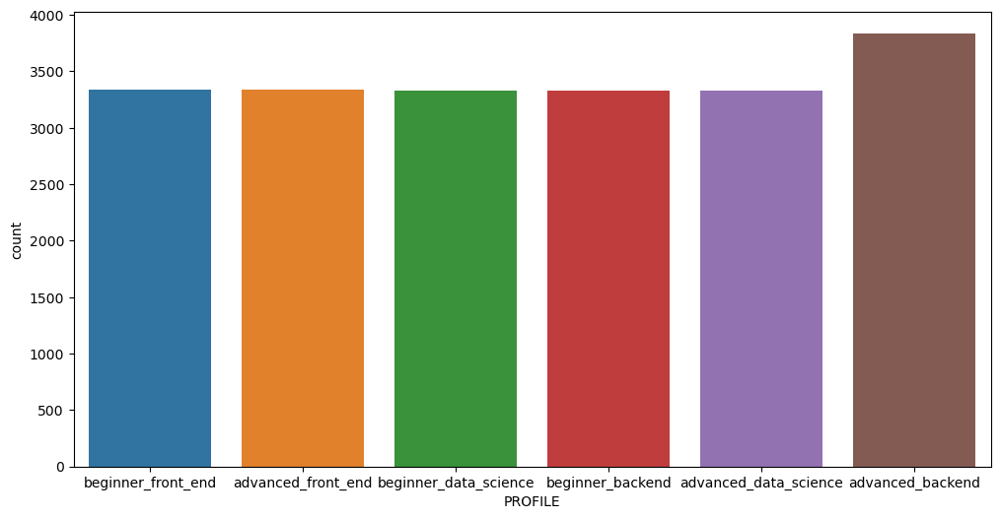

In [59]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='PROFILE')
plt.show()

### Violin plot

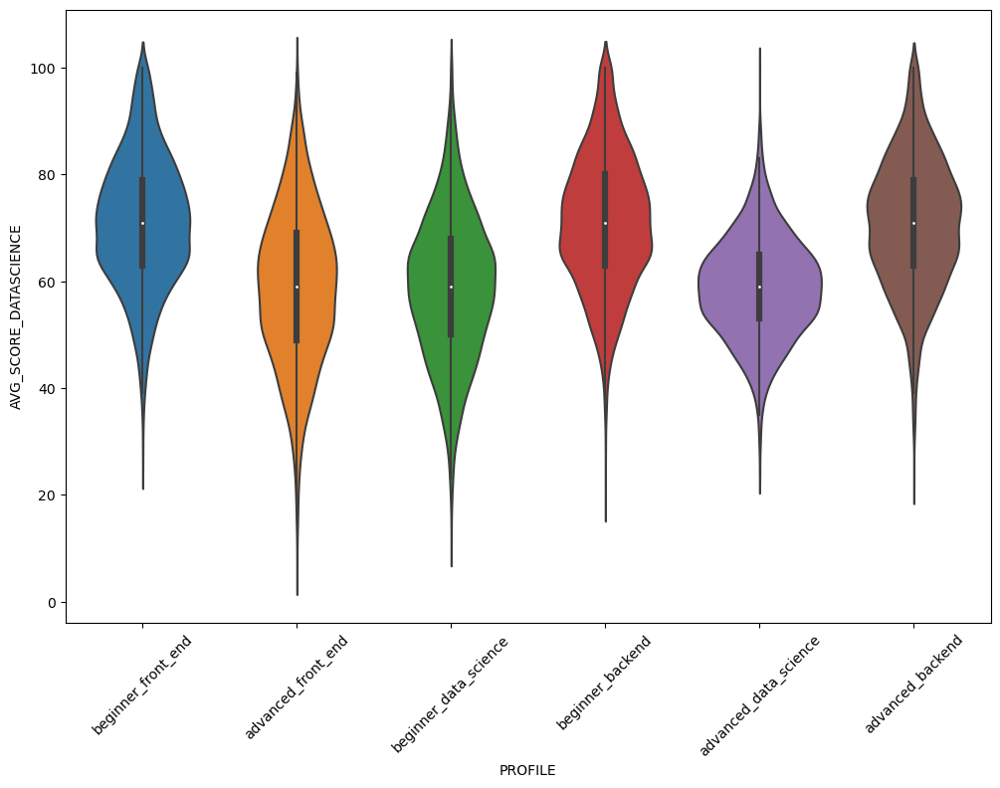

In [132]:
plt.figure(figsize=(12, 8))
sns.violinplot(data=df, x='PROFILE', y='AVG_SCORE_DATASCIENCE')
plt.xticks(rotation=45)
plt.show()

C:\Users\Sham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Sham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Sham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Sham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

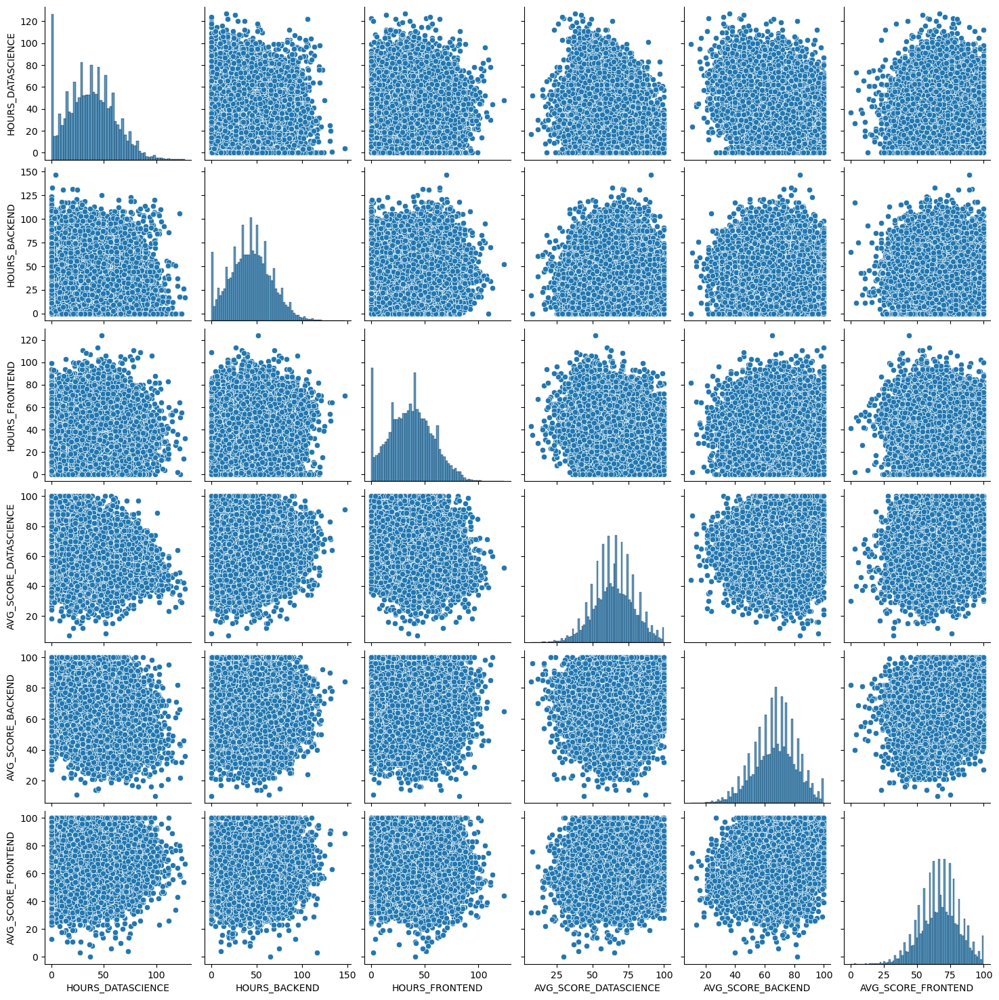

In [65]:
# Pairwise scatter plot matrix
sns.pairplot(df[['HOURS_DATASCIENCE', 'HOURS_BACKEND', 'HOURS_FRONTEND',
                 'AVG_SCORE_DATASCIENCE', 'AVG_SCORE_BACKEND', 'AVG_SCORE_FRONTEND']])
plt.show()

### Pie Chart


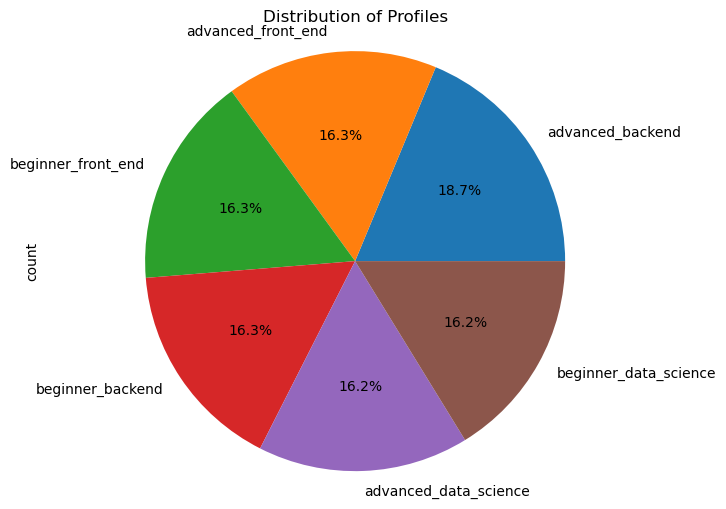

In [69]:
plt.figure(figsize=(8, 6))
df['PROFILE'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.axis('equal')
plt.title('Distribution of Profiles')
plt.show()

### 3D pie chart

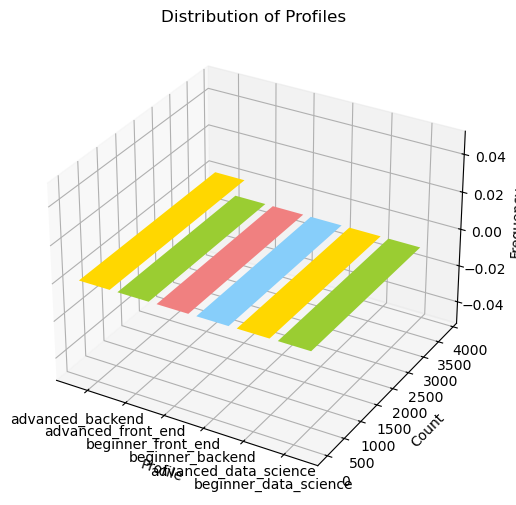

In [90]:
# Count the occurrences of each profile
profile_counts = df['PROFILE'].value_counts()

fig = plt.figure(figsize=(6, 8))
ax = fig.add_subplot(111, projection='3d')

# Set the positions for the bars
x_pos = np.arange(len(profile_counts))

# Plot the bars
ax.bar(x_pos, profile_counts, color=['gold', 'yellowgreen', 'lightcoral', 'lightskyblue'])

# Set the labels for the bars
ax.set_xticks(x_pos)
ax.set_xticklabels(profile_counts.index)

# Set title and labels
ax.set_title('Distribution of Profiles')
ax.set_xlabel('Profile')
ax.set_ylabel('Count')
ax.set_zlabel('Frequency')

plt.show()

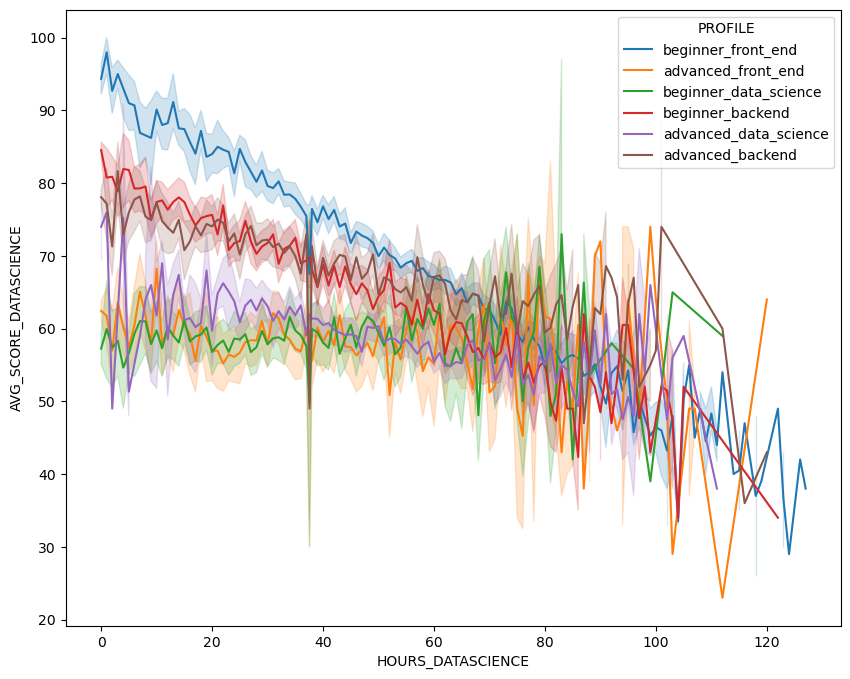

In [76]:
# Line plot
plt.figure(figsize=(10, 8))
sns.lineplot(data=df, x='HOURS_DATASCIENCE', y='AVG_SCORE_DATASCIENCE', hue='PROFILE')
plt.show()

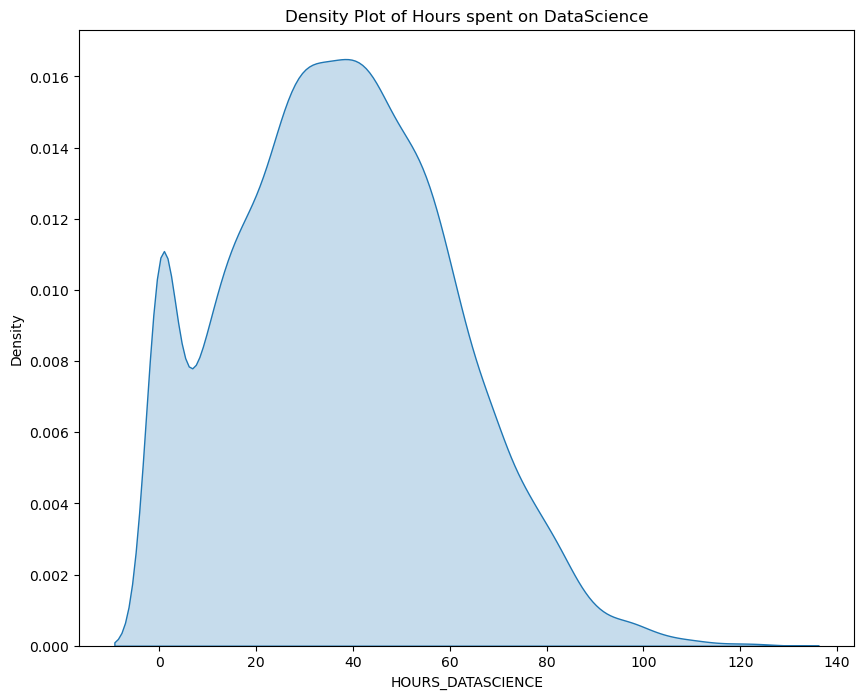

In [79]:
plt.figure(figsize=(10, 8))
sns.kdeplot(data=df['HOURS_DATASCIENCE'], shade=True)
plt.title('Density Plot of Hours spent on DataScience')
plt.show()


### Taking the necessary columns for a better visualization

In [96]:
x = df['PROFILE']
y1 = df['HOURS_DATASCIENCE']
y2 = df['HOURS_BACKEND']
y3 = df['HOURS_FRONTEND']

### Radar Chart

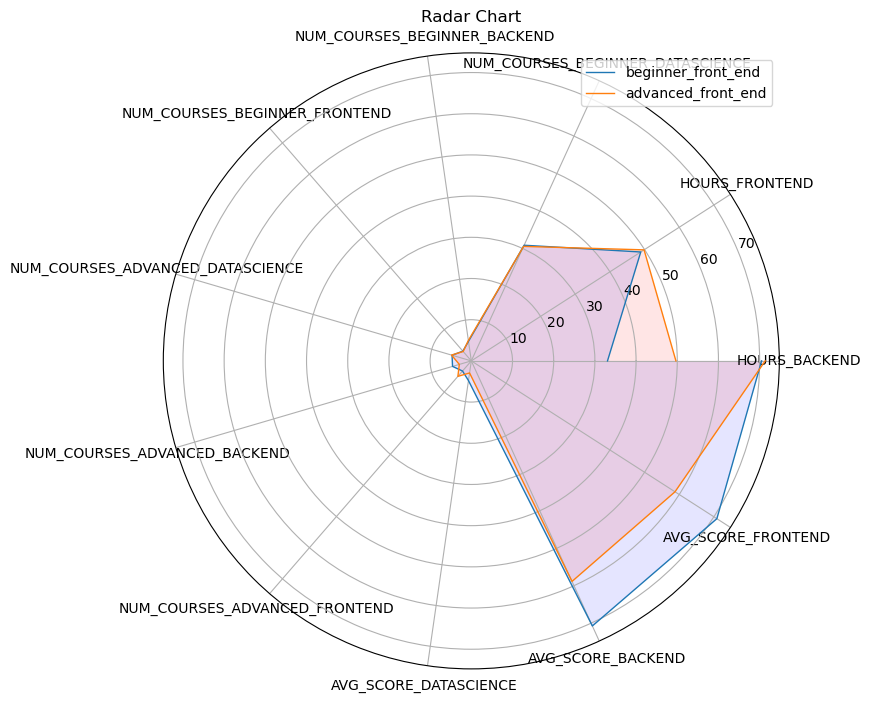

In [100]:

plt.figure(figsize=(10, 8))
categories = df.columns[1:-1]  # Exclude 'PROFILE'
values = df.groupby('PROFILE').mean().values.tolist()
values += values[:1]  # Repeat the first value to close the circle
angles = [n / float(len(categories)) * 2 * np.pi for n in range(len(categories))]
angles += angles[:1]
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories)
ax.plot(angles, values[0], linewidth=1, linestyle='solid', label=df['PROFILE'].unique()[0])
ax.fill(angles, values[0], 'b', alpha=0.1)
ax.plot(angles, values[1], linewidth=1, linestyle='solid', label=df['PROFILE'].unique()[1])
ax.fill(angles, values[1], 'r', alpha=0.1)
plt.title('Radar Chart')
plt.legend(loc='upper right')
plt.show()

### 3d bar chard

AttributeError: 'numpy.float64' object has no attribute 'startswith'

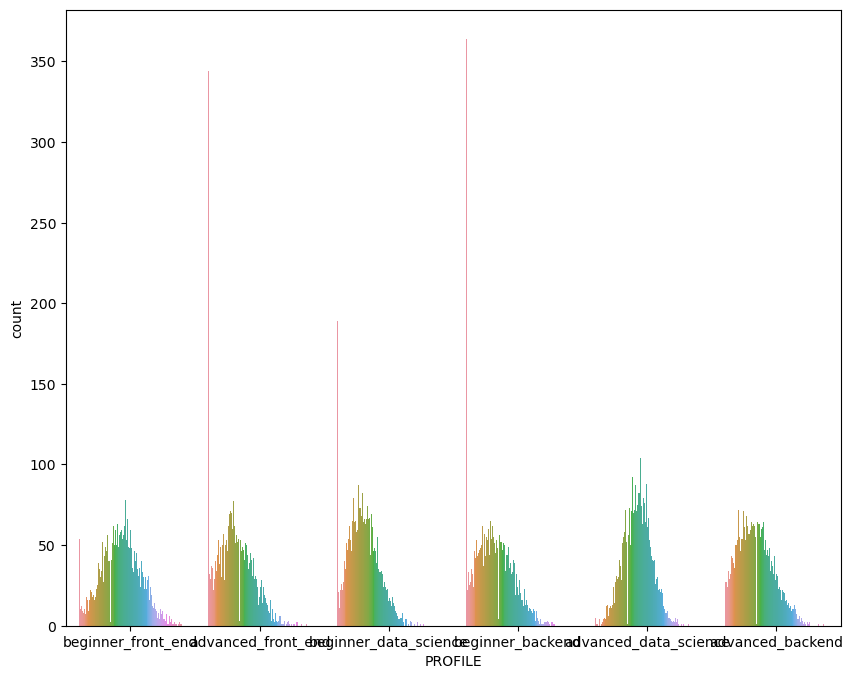

In [101]:
# Clustered Bar Chart
plt.figure(figsize=(10, 8))
sns.countplot(data=df, x='PROFILE', hue='HOURS_DATASCIENCE')
plt.xticks(rotation=45)
plt.legend(title='Hours spent on DataScience')
plt.title('Clustered Bar Chart')
plt.show()

### 3D Density Plot

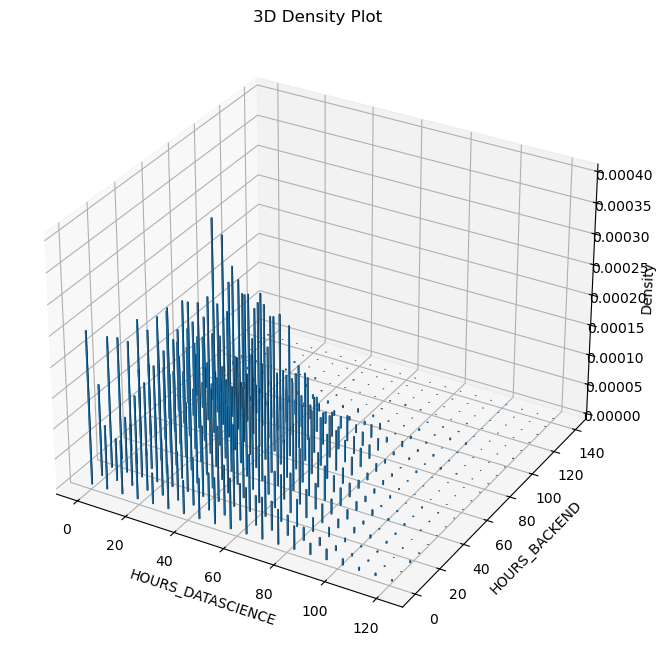

In [102]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
hist, xedges, yedges = np.histogram2d(df['HOURS_DATASCIENCE'], df['HOURS_BACKEND'], bins=20, density=True)
xpos, ypos = np.meshgrid(xedges[:-1], yedges[:-1], indexing="ij")
xpos = xpos.ravel()
ypos = ypos.ravel()
zpos = 0
dx = dy = 0.5 * np.ones_like(zpos)
dz = hist.ravel()
ax.bar3d(xpos, ypos, zpos, dx, dy, dz, zsort='average')
ax.set_xlabel('HOURS_DATASCIENCE')
ax.set_ylabel('HOURS_BACKEND')
ax.set_zlabel('Density')
plt.title('3D Density Plot')
plt.show()

In [113]:
columns = ['HOURS_DATASCIENCE', 'HOURS_BACKEND', 'HOURS_FRONTEND',
           'NUM_COURSES_BEGINNER_DATASCIENCE', 'NUM_COURSES_BEGINNER_BACKEND',
           'NUM_COURSES_BEGINNER_FRONTEND', 'NUM_COURSES_ADVANCED_DATASCIENCE',
           'NUM_COURSES_ADVANCED_BACKEND', 'NUM_COURSES_ADVANCED_FRONTEND',
           'AVG_SCORE_DATASCIENCE', 'AVG_SCORE_BACKEND', 'AVG_SCORE_FRONTEND',
           'PROFILE']
import plotly.express as px

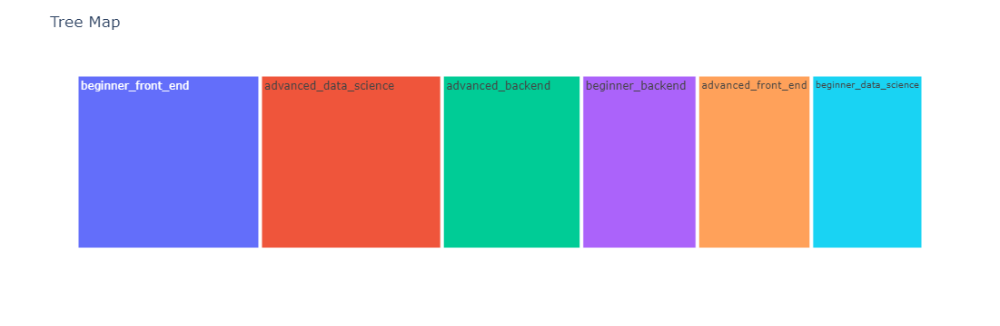

In [114]:
fig = px.treemap(df, path=['PROFILE'], values='HOURS_DATASCIENCE')
fig.update_layout(title='Tree Map')
fig.show()


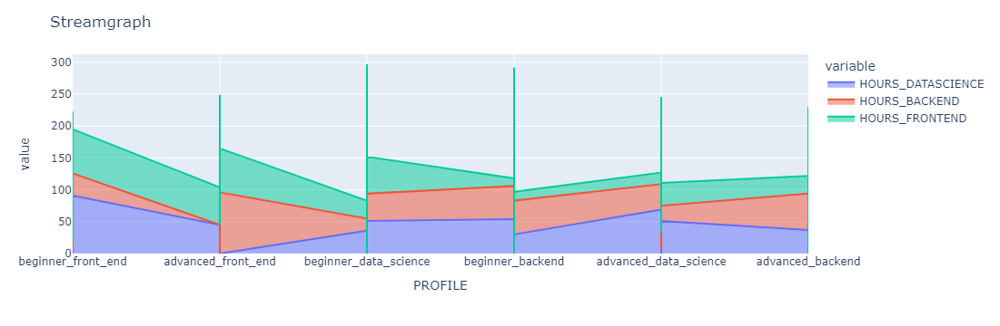

In [117]:
fig = px.area(df, x='PROFILE', y=['HOURS_DATASCIENCE', 'HOURS_BACKEND', 'HOURS_FRONTEND'])
fig.update_layout(title='Streamgraph')
fig.show()


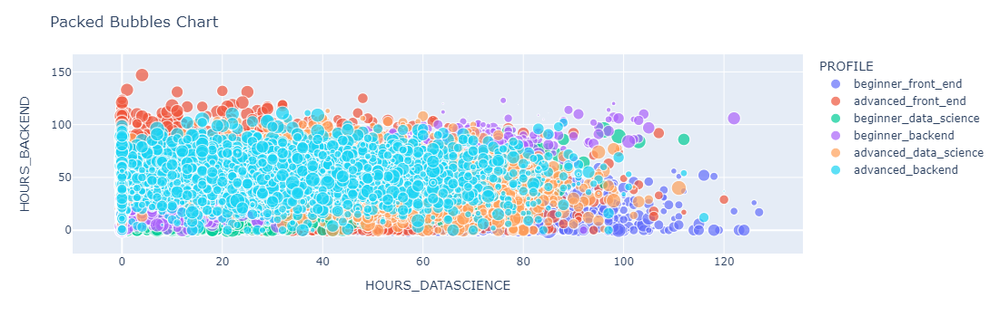

In [118]:
fig = px.scatter(df, x='HOURS_DATASCIENCE', y='HOURS_BACKEND', size='HOURS_FRONTEND', color='PROFILE')
fig.update_layout(title='Packed Bubbles Chart')
fig.show()


<Figure size 1000x800 with 0 Axes>

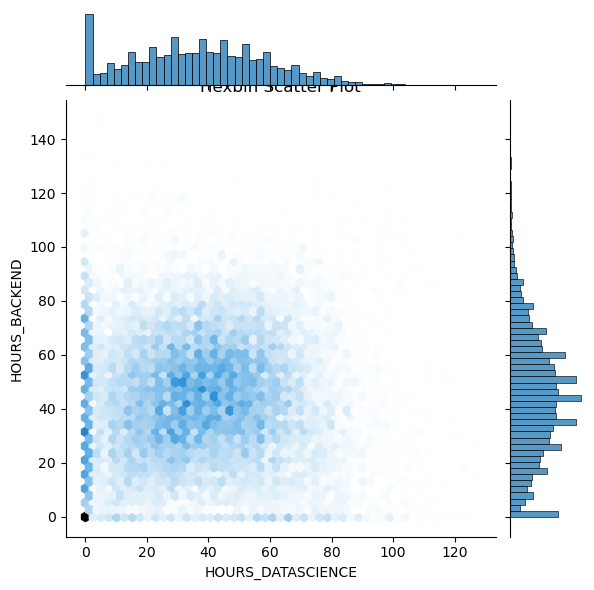

In [119]:
plt.figure(figsize=(10, 8))
sns.jointplot(data=df, x='HOURS_DATASCIENCE', y='HOURS_BACKEND', kind='hex')
plt.title('Hexbin Scatter Plot')
plt.show()


In [125]:
!pip install wordcloud

   ---------------------------------------- 0.0/300.2 kB ? eta -:--:--
   - -------------------------------------- 10.2/300.2 kB ? eta -:--:--
   ---- ----------------------------------- 30.7/300.2 kB 1.3 MB/s eta 0:00:01
   ---------- ---------------------------- 81.9/300.2 kB 762.6 kB/s eta 0:00:01
   ---------------------------------------- 300.2/300.2 kB 2.3 MB/s eta 0:00:00


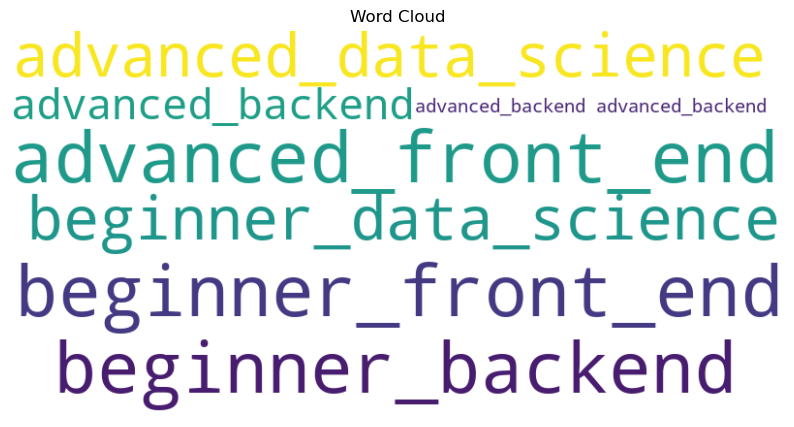

In [126]:
from wordcloud import WordCloud

text = ' '.join(df['PROFILE'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud')
plt.show()
